# Исследование рынка заведений общественного питания Москвы

<b>Описание проекта:</b>
<br>Необходимо подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты заказчикам - инвесторам из фонда «Shut Up and Take My Money», желающим открыть заведение общественного питания в Москве (ресторан, кафе, кофейню и т.п.)</br>
<br>Исходные данные: датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.


<b>ОГЛАВЛЕНИЕ:</b>
1. [Загрузка данных и изучение общей информации](#start)
    * [Открытие и изучение датасета](#start_1)
    * [Построение общих гистограмм](#start_2)
    * [Вывод](#start_3)

2. [  Предобработка данных](#preprocessing)
    * [  Проверка дубликатов](#preprocessing_2)
    * [  Работа с пропусками](#preprocessing_3)
    * [  Работа с аномалиями](#preprocessing_4)
    * [  Создание столбца с названиями улиц из столбца с адресом](#preprocessing_5)
    * [  Создание столбца is_/ с обозначением, что заведение работает ежедневно и круглосуточно (/)](#preprocessing_6)
    * [  Вывод:](#preprocessing_7)
3. [  Анализ данных](#analysis)
    * [  Какие категории заведений представлены в данных](#analysis_1)
    * [  Исследование количества посадочных мест в заведениях по категориям: рестораны, кофейни, пиццерии, бары и так далее](#analysis_2)
    * [  Cоотношение сетевых и несетевых заведений в датасете](#analysis_3)
    * [  Какие категории заведений чаще являются сетевыми](#analysis_4)
    * [  Топ- популярных сетей в Москве](#analysis_5)
    * [  Общее количество заведений и количество заведений каждой категории по районам](#analysis_6)
    * [  Распределение средних рейтингов по категориям заведений](#analysis_7)
    * [  Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района](#analysis_8)
    * [  Все заведения датасета на карте](#analysis_9)
    * [  Топ- улиц по количеству заведений График распределения количества заведений и их категорий по этим улицам](#analysis_10)
    * [  Улицы, на которых находится только один объект общепита](#analysis_11)
    * [  Фоновая картограмма (хороплет) со средними чеками для каждого района](#analysis_12)
    * [  Средние чеки в заведениях с плохим рейтингом](#analysis_13)
    * [  Категории заведений с низким рейтингом](#analysis_14)
    * [  Вывод:](#analysis_15)
4. [  Детализация исследования: открытие кофейни](#detail)
    * [  Кофейни в датасете Их расположения и особенности](#detail_1)
    * [  Рейтинги кофеен](#detail_2)
    * [  Определение стоимости кашки капучино](#detail_3)
    * [  Рекомендация по открытию кофейни](#detail_4)
5. [Вывод](#total)

### Загрузка данных и изучение общей информации<a id="start"></a> 

#### Открытие и изучение датасета<a id="start_1"></a>

In [1]:
# Импортируем необходимые библиотеки 
import pandas as pd
import scipy.stats as stats
import numpy as np
from numpy import sum
import datetime as dt
from matplotlib import pyplot as plt
import seaborn as sns
from pandas.plotting import register_matplotlib_converters
import warnings
register_matplotlib_converters()
import plotly.express as px
from plotly import graph_objects as go 
from folium import Map, Choropleth
from folium import Map, Marker
from folium.plugins import MarkerCluster

In [2]:
# загружаем данные из файла в датасет
df = pd.read_csv('/datasets/moscow_places.csv')
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


В представленном датасете 14 столбцов и 8406 строк. 
<br> В некоторых столбцах большое количество пропущенных значений - hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats</br>
<br> Столбцы name, category, address, district, hours, price, avg_bill хранят значения типа данных object</br>
<br> Столбцы lat, lng, rating, middle_avg_bill, middle_coffee_cup, seats хранят значения вещественного типа данных</br>
<br> Столбец chain - значения целочисленного типа данных</br>

In [4]:
df['name'].nunique()

5614

В датасете представлено 5614 заведений

#### Построение общих гистограмм<a id="start_2"></a>

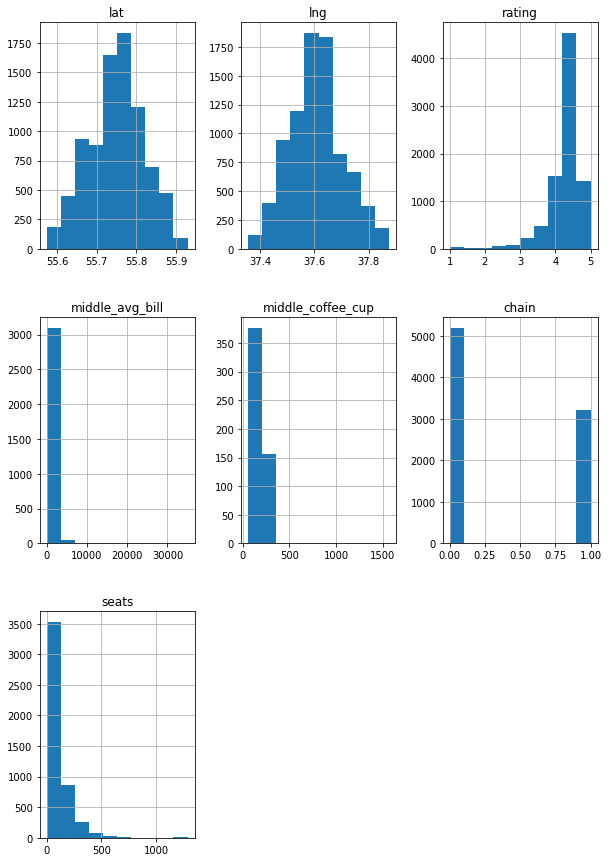

In [5]:
df.hist(figsize=(10,15))
plt.show()

В столбце lng больше всего значений долготы расположены в диапазоне  55.7 - 55.8.
<br>В столбце lat больше всего значений широты расположены в диапазоне 37.5 - 37.7.</br>
<br>В столбце rating рейтинг заведений имеет в большинстве случаев значение от 4 до 5</br>
<br>Больше всего строк со средним чеком до ~3000 рублей. </br>
<br>Больше всего строк со средней ценой чашки кофе до 400 руб.</br>
<br> В датасете представлено больше несетевых заведений, нежели сетевых.</br>
<br> Больше всего заведений с менее 100 посадочных мест</br>

#### Вывод:<a id="start_3"></a>

В датасете большое количество пропущенных значений. Необходимо определить сущность пропусков и заполнить их там, где необходимо.
<br>В представленном датасете 14 столбцов и 8406 строк.</br>
<br>В датасете 5614 заведений</br>
<br>Больше всего строк со средним чеком до ~3000 рублей. Больше всего строк со средней ценой чашки кофе до 400 руб.
В датасете представлено больше несетевых заведений, нежели сетевых. У большинства строк менее 100 посадочных мест</br>
<br> Типы данных в датасете корректны</br>

### Предобработка данных<a id="preprocessing"></a>

#### Проверка дубликатов<a id="preprocessing_1"></a>

In [6]:
print(df.duplicated().sum())

0


Явных дубликатов нет

Проверим неявные дубликаты

In [7]:
# сгруппируем по 3 столбцам name и address и district и посчитаем дубликаты
df.duplicated(subset=['name','address','district']).sum()

0

In [8]:
# сгруппируем по 3 столбцам name и lat и lng и посчитаем дубликаты
df.duplicated(subset=['name','lat','lng']).sum()

0

Нет дубликатов

In [9]:
# Выведем дубликаты по name
duplicates_row = df[df['name'].duplicated(keep=False)]
duplicates_row

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
13,Буханка,булочная,"Москва, Базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,NaN,NaN,NaN,NaN,1,180.0
19,Пекарня,булочная,"Москва, Ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.887969,37.515688,4.4,NaN,NaN,NaN,NaN,1,NaN
20,Чебуреки Манты,кафе,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.880287,37.448646,4.3,NaN,NaN,NaN,NaN,1,148.0
23,Буханка,булочная,"Москва, Лобненская улица, 13к2",Северный административный округ,"ежедневно, 08:00–22:00",55.888421,37.527106,4.7,NaN,NaN,NaN,NaN,1,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8317,Беседка,кафе,"Москва, Кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,1,NaN
8340,Семейный Очаг,ресторан,"Москва, Шоссейная улица, 13",Юго-Восточный административный округ,"ежедневно, 12:00–00:00",55.688104,37.725197,4.3,средние,Средний счёт:до 1000 ₽,1000.0,NaN,1,98.0
8372,Чайхана Sabr,ресторан,"Москва, улица Хлобыстова, 22",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.716361,37.813436,3.9,средние,Средний счёт:150–350 ₽,250.0,NaN,1,32.0
8379,Лагман Хаус,кафе,"Москва, Новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,1,40.0


Дубликаты по name связаны с разными адресами сетевых заведений

Проверим категориальные данные на наличие неявных дубликатов

In [10]:
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [11]:
df['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [12]:
df['avg_bill'].unique()

array([nan, 'Средний счёт:1500–1600 ₽', 'Средний счёт:от 1000 ₽',
       'Цена чашки капучино:155–185 ₽', 'Средний счёт:400–600 ₽',
       'Средний счёт:199 ₽', 'Средний счёт:200–300 ₽',
       'Средний счёт:от 500 ₽', 'Средний счёт:1000–1200 ₽',
       'Цена бокала пива:250–350 ₽', 'Средний счёт:330 ₽',
       'Средний счёт:1500 ₽', 'Средний счёт:300–500 ₽',
       'Средний счёт:140–350 ₽', 'Средний счёт:350–500 ₽',
       'Средний счёт:300–1500 ₽', 'Средний счёт:от 240 ₽',
       'Средний счёт:200–250 ₽', 'Средний счёт:328 ₽',
       'Средний счёт:300 ₽', 'Средний счёт:от 345 ₽',
       'Средний счёт:60–400 ₽', 'Средний счёт:900 ₽',
       'Средний счёт:500–800 ₽', 'Средний счёт:500–1000 ₽',
       'Средний счёт:600–700 ₽', 'Цена бокала пива:120–350 ₽',
       'Средний счёт:1000–1500 ₽', 'Средний счёт:1500–2000 ₽',
       'Цена чашки капучино:150–190 ₽', 'Средний счёт:2000–2500 ₽',
       'Средний счёт:600 ₽', 'Средний счёт:450 ₽',
       'Цена чашки капучино:120–170 ₽', 'Средний счё

Проверим неявные дубликаты по name. Для этого создадим группировку

Дубликатов в датасете нет

#### Работа с пропусками<a id="preprocessing_2"></a>

In [13]:
# выведем строки с пустыми значениями в столбце hours
df[df['hours'].isna()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
38,Ижора,булочная,"Москва, Ижорский проезд, 5А",Северный административный округ,NaN,55.888366,37.514856,4.4,NaN,NaN,NaN,NaN,0,NaN
40,Кафе,кафе,"Москва, Ижорская улица, 18, стр. 1",Северный административный округ,NaN,55.895115,37.524902,3.7,NaN,NaN,NaN,NaN,0,NaN
44,Кафетерий,кафе,"Москва, Ангарская улица, 24А",Северный административный округ,NaN,55.876289,37.519315,3.8,NaN,NaN,NaN,NaN,1,8.0
56,Рыба из тандыра,быстрое питание,"Москва, Коровинское шоссе, 46, стр. 5",Северный административный округ,NaN,55.888010,37.515960,1.5,NaN,NaN,NaN,NaN,0,NaN
108,Кафе,"бар,паб","Москва, МКАД, 82-й километр, вл18",Северо-Восточный административный округ,NaN,55.908930,37.558777,4.2,NaN,NaN,NaN,NaN,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8236,1у,кафе,"Москва, Нагатинская набережная, 40/1к1",Южный административный округ,NaN,55.685528,37.673546,3.4,NaN,NaN,NaN,NaN,0,NaN
8375,Улица Гурьянова 55,кафе,"Москва, улица Гурьянова, 55",Юго-Восточный административный округ,NaN,55.679981,37.717034,4.5,NaN,NaN,NaN,NaN,0,NaN
8378,Восточно-грузинская кухня,быстрое питание,"Москва, Зеленодольская улица, 32, корп. 3",Юго-Восточный административный округ,NaN,55.710540,37.767864,4.3,NaN,NaN,NaN,NaN,0,120.0
8381,Аэлита,кафе,"Москва, Ферганская улица, 8, корп. 2, стр. 1",Юго-Восточный административный округ,NaN,55.708871,37.803831,3.8,NaN,NaN,NaN,NaN,0,30.0


Заполнение пропусков в данном столбце не представляется возможным и не имеет особо смысла в дальнейшем исследовании.

Для дальнейшего исследования понадобятся столбцы middle_avg_bill и middle_coffee_cup

In [14]:
# выведем строки с пустыми значениями в столбце middle_avg_bill
df[df['middle_avg_bill'].isna()].head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
10,Great Room Bar,"бар,паб","Москва, Левобережная улица, 12",Северный административный округ,"ежедневно, круглосуточно",55.877832,37.469171,4.5,средние,Цена бокала пива:250–350 ₽,NaN,NaN,0,102.0
11,Шашлык Шефф,кафе,"Москва, улица Маршала Федоренко, 10с1",Северный административный округ,"ежедневно, 10:00–21:00",55.881770,37.492362,4.9,NaN,NaN,NaN,NaN,0,NaN


In [15]:
# # выведем строки с пустыми значениями в столбце middle_coffee_cup
df[df['middle_coffee_cup'].isna()].head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN


Проверим пропуски в middle_avg_bill по наличию в avg_bill надписи "Средний счёт"

In [16]:
# подсчитаем количество строк с наличием "Средний счёт"
counts=0
for row in df.index:
    if 'Средний счёт' in str(df['avg_bill'].iloc[row]):
        counts+=1
counts

3149

In [17]:
# подсчитаем количество значений в столбце
df['middle_avg_bill'].count()

3149

Так как, по условию, значения в данном столбце указаны только при наличии значений из столбца avg_bill, начинающихся с подстроки «Средний счёт», то заполнять пропуски нет смысла. 

Тоже самое сделаем для столбца middle_coffee_cup

In [18]:
# подсчитаем количество строк с наличием "Цена чашки капучино"
counts=0
for row in df.index:
    if 'Цена чашки капучино' in str(df['avg_bill'].iloc[row]):
        counts+=1
counts

535

In [19]:
# подсчитаем количество значений в столбце
df['middle_coffee_cup'].count()

535

Аналогичная ситуация. Можно предположить, что пропуски вызваны разными категориями заведений. Т.к. на middle_coffee_cup и на middle_avg_bill влияет значение из avg_bill, то пропуски не являются ошибкой. Там, где пропуски в avg_bill, пропуски в данных столбцах. 
<br> Также, в столбце avg_bill есть строки начинаещиеся с "Цена бокала пива". Подсчитаем количество

In [20]:
counts=0
for row in df.index:
    if 'Цена бокала пива' in str(df['avg_bill'].iloc[row]):
        counts+=1
counts

132

Всего 132 строки. На анализ они не повлияют. Можно не учитывать в дальнейшем. 
<br> Заполнять пропуски медианами или средними значениями не считаю целесообразным, т.к. чеки в сетевых заведениях от района к району могут сильно разниться, не говоря уже о несетевых заведениях.</br> Для более объективной картины оставим пропуски как есть


#### Работа с аномалиями<a id="preprocessing_3"></a>

На общих гистограммах было видно, что присутствуют слишком большие значения  в столбцах seats, middle_avg_bill
<br> Проверим на выбросы

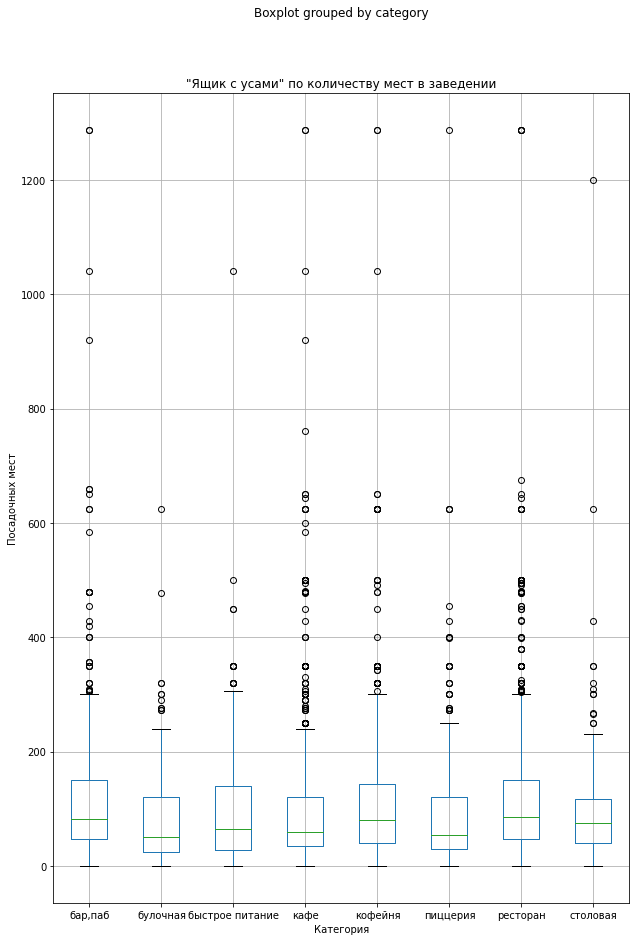

In [21]:
# построим ящик с усами и разобъем на категории
df.boxplot(column='seats', by='category', figsize=(10,15))
plt.title('"Ящик с усами" по количеству мест в заведении')
plt.xlabel('Категория')
plt.ylabel('Посадочных мест')
plt.show()

Видно, что более 700 мест - это стат выбросы. Проверим, сколько всего таких значений. 

In [22]:
df[df['seats']>700]['name'].count()

19

Попробуем посчитать сколько заведений с более чем 500 мест

In [23]:
df[df['seats']>500]['name'].count()

56

In [24]:
# посчитаем сколько % от всех заведений
df[df['seats']>500]['name'].count()/df['name'].nunique()

0.00997506234413965

1% заведений - выбросов. Удалим данные строки.

In [25]:
# создадим новый датафрейм и перезапишем данные
data = df[(df['seats']<500)|(df['seats'].isna())]
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8329 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8329 non-null   object 
 1   category           8329 non-null   object 
 2   address            8329 non-null   object 
 3   district           8329 non-null   object 
 4   hours              7801 non-null   object 
 5   lat                8329 non-null   float64
 6   lng                8329 non-null   float64
 7   rating             8329 non-null   float64
 8   price              3282 non-null   object 
 9   avg_bill           3777 non-null   object 
 10  middle_avg_bill    3116 non-null   float64
 11  middle_coffee_cup  529 non-null    float64
 12  chain              8329 non-null   int64  
 13  seats              4718 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 976.1+ KB


Проверим столбец middle_avg_bill

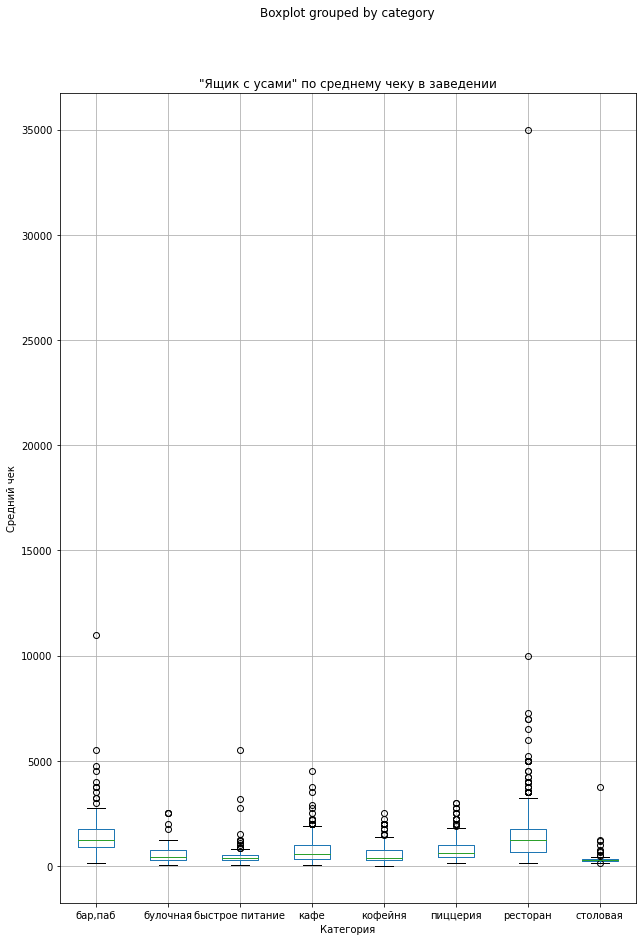

In [26]:
# построим ящик с усами и разобъем на категории
df.boxplot(column='middle_avg_bill', by='category', figsize=(10,15))
plt.title('"Ящик с усами" по среднему чеку в заведении')
plt.xlabel('Категория')
plt.ylabel('Средний чек')
plt.show()

Средний чек 35 000, вероятно, имеет место быть, т.к. это может быть очень дорогое заведения. Попробуем вывести все строки с чеком более 6000 руб.

In [27]:
data.query('middle_avg_bill>6000')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
730,Чойхона,"бар,паб","Москва, Дмитровское шоссе, 95А",Северный административный округ,"ежедневно, 10:00–23:00",55.871497,37.543555,4.4,высокие,Средний счёт:5000–17000 ₽,11000.0,NaN,0,49.0
3396,Марио,ресторан,"Москва, улица Климашкина, 17",Центральный административный округ,"ежедневно, 12:00–00:00",55.767792,37.568453,4.5,высокие,Средний счёт:7000 ₽,7000.0,NaN,0,100.0
3487,800°с Contemporary Steak,ресторан,"Москва, Большой Патриарший переулок, 6, стр. 1",Центральный административный округ,"ежедневно, 09:00–23:30",55.762708,37.592138,4.7,высокие,Средний счёт:6000–8000 ₽,7000.0,NaN,0,75.0
3518,Чайка,ресторан,"Москва, Краснопресненская набережная, 12А",Центральный административный округ,"ежедневно, 12:00–00:00",55.752857,37.556365,4.8,высокие,Средний счёт:5000–8000 ₽,6500.0,NaN,1,250.0
3882,White Rabbit,ресторан,"Москва, Смоленская площадь, 3",Центральный административный округ,"ежедневно, 12:00–00:00",55.747608,37.581248,4.9,высокие,Средний счёт:7000–7500 ₽,7250.0,NaN,0,150.0
5481,Гости,ресторан,"Москва, шоссе Энтузиастов, 52",Восточный административный округ,"пн,вс 18:00–22:30",55.759088,37.760570,4.1,высокие,Средний счёт:5000–15000 ₽,10000.0,NaN,0,NaN
7177,Кафе,ресторан,"Москва, Каширское шоссе, 23, стр. 2",Южный административный округ,"ежедневно, круглосуточно",55.657450,37.646665,4.1,высокие,Средний счёт:20000–50000 ₽,35000.0,NaN,0,100.0


Интересно, что за "Кафе" ресторан на Каширском шоссе со средним чеком 35 000 рублей. 
<br> Проверил в открытых источниках: это небольшое кафе на территории онкологического центра. Большие сомнения, что представленная исходная информация соответствует действительности. Чтобы данный стат. выброс сильно не влиял на будущий анализ, удалим данную строку из датасета</br>

In [28]:
data = data[(df['middle_avg_bill']<12000)|(data['middle_avg_bill'].isna())]
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8328 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8328 non-null   object 
 1   category           8328 non-null   object 
 2   address            8328 non-null   object 
 3   district           8328 non-null   object 
 4   hours              7800 non-null   object 
 5   lat                8328 non-null   float64
 6   lng                8328 non-null   float64
 7   rating             8328 non-null   float64
 8   price              3281 non-null   object 
 9   avg_bill           3776 non-null   object 
 10  middle_avg_bill    3115 non-null   float64
 11  middle_coffee_cup  529 non-null    float64
 12  chain              8328 non-null   int64  
 13  seats              4717 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 975.9+ KB


/tmp/ipykernel_30/3582608515.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  data = data[(df['middle_avg_bill']<12000)|(data['middle_avg_bill'].isna())]


Таким образом, избавились от аномалий в столбцах middle_avg_bill и seats

#### Создание столбца  с названиями улиц из столбца с адресом<a id="preprocessing_4"></a>

Создадим цикл, который вернет в новый столбец названия улиц

In [29]:
# создадим новый столбец чтобы включить его в цикл
data['street']=data['address'][row].split(",")[1].strip()
for row in data.index:
    data['street'][row]=data['address'][row].split(",")[1].strip()
data.head(5)

/tmp/ipykernel_30/2385576606.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['street'][row]=data['address'][row].split(",")[1].strip()


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


In [30]:
data['street'].isna().sum()

0

Пропусков нет. Все улицы подтянуты корректно

#### Создание столбца is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)<a id="preprocessing_4"></a>

In [31]:
# создадим новый столбец, чтобы включить его в цикл
data['is_24/7']=True
for row in data.index:
    if data['hours'][row]=='ежедневно, круглосуточно':
        data['is_24/7'][row]=True
    else:
        data['is_24/7'][row]=False
data


/tmp/ipykernel_30/3833725585.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['is_24/7'][row]=False
/tmp/ipykernel_30/3833725585.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['is_24/7'][row]=True


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,Профсоюзная улица,False
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,Пролетарский проспект,False
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица,True
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,Люблинская улица,True


Проверим столбец. Отфильтруем по ежедневно, круглосуточно  и посмотрим уникальные значения

In [32]:
data[data['hours']=='ежедневно, круглосуточно']['is_24/7'].unique()

array([ True])

Столбец добавлен успешно

#### Вывод:<a id="preprocessing_6"></a>

Проведена предобработка данных.
<br>Явных и неявных дубликатов в датасете не оказалось.</br>
<br>Было решено не заполнять пропуски медианами или средними значениями , т.к. чеки в сетевых заведениях от района к району могут сильно разниться, не говоря уже о несетевых заведениях. Для более объективной картины оставили пропуски как есть</br>
<br>Из датасета удалены аномалии с большим количеством посадочных мест. Оставлены только те строки, где посадочных мест менее 500 (удалено менее 1%).</br>
<br> Также, удалена строка с аномальным средним чеком кафе на территории больницы</br>
<br> Добавлены столбец с названиями улиц, столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)</br>

### Анализ данных<a id="analysis"></a>

#### Какие категории заведений представлены в данных<a id="analysis_1"></a>

In [33]:
# построим график распределения заведений по категориям
data_categorized = data.groupby('category', as_index=False)['name'].count()

go.Figure(data=[go.Pie(labels=data_categorized['category'], values=data_categorized['name'])], 
          layout=go.Layout(title=go.layout.Title(text="Количество заведений по категориям")))

In [34]:
data_categorized['percentage']=round((data_categorized['name']/data_categorized['name'].sum())*100,2)
data_categorized.sort_values(by='percentage', ascending=False)

,category,name,percentage
3,кафе,2356,28.29
6,ресторан,2021,24.27
4,кофейня,1398,16.79
0,"бар,паб",755,9.07
5,пиццерия,629,7.55
2,быстрое питание,601,7.22
7,столовая,313,3.76
1,булочная,255,3.06


Больше всего кафе и ресторанов - 2356(28%) и 2021(24%) соответственно.
<br>Далее, кофейни - 1398 (17%)</br>
<br>Бары, пабы - 755 (9%)</br>
<br>Пиццерий - 629 (8%)</br>
<br> Быстрого питания - 601 (7%)</br>
<br>Столовых - 313(4%)</br>
<br>Булочных - 255 (3%)</br>

#### Исследование количества посадочных мест в заведениях по категориям: рестораны, кофейни, пиццерии, бары и так далее. <a id="analysis_2"></a>

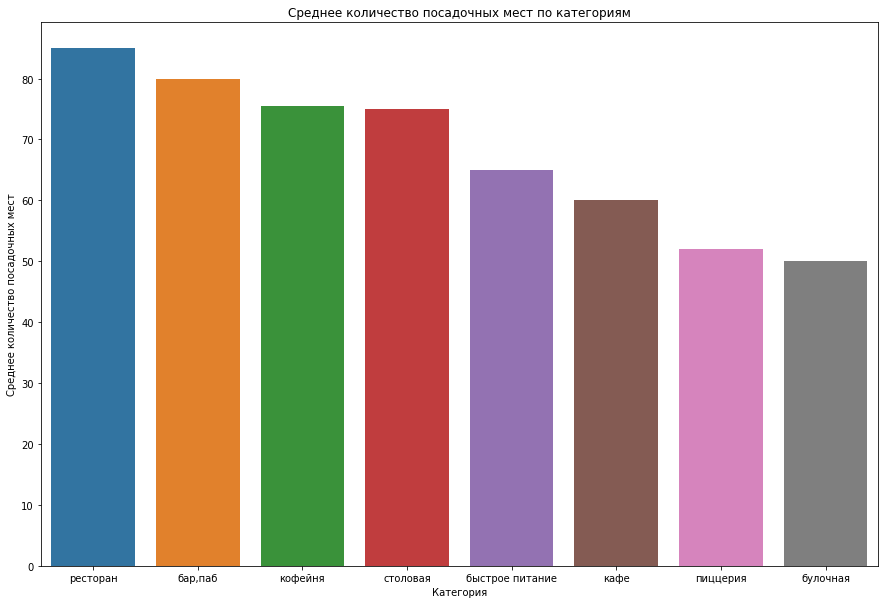

In [35]:
data_categorized_seats = data.groupby('category', as_index=False)['seats'].median().sort_values(by='seats', ascending=False)

plt.figure(figsize=(15, 10))
plt.title('Среднее количество посадочных мест по категориям')
ax = sns.barplot(x='category', y='seats', data=data_categorized_seats)
plt.xlabel('Категория')
plt.ylabel('Среднее количество посадочных мест')
plt.show()

In [36]:
data_categorized_seats.sort_values(by='seats', ascending=False)

,category,seats
6,ресторан,85.0
0,"бар,паб",80.0
4,кофейня,75.5
7,столовая,75.0
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,52.0
1,булочная,50.0


Больше всего в среднем посадочных мест в ресторанах  и барах/пабах - 85 и 80 мест соответственно
<br>Менее всего в пиццериях и булочных - 52 и 50 мест соответственно</br>

#### Cоотношение сетевых и несетевых заведений в датасете<a id="analysis_3"></a>

In [37]:
# сгруппируем по столбцу chain
data_categorized_chain = data.groupby('chain', as_index=False)['name'].count()
# добавим столбец с процентом
data_categorized_chain['percentage']=round((data_categorized_chain['name']/data_categorized_chain['name'].sum())*100,2)
# заменим 0 на "несетевое", 1 на "сетевое"
data_categorized_chain['chain2']='Сетевое'
for row in data_categorized_chain.index:
    if data_categorized_chain['chain'][row]==1:
        data_categorized_chain['chain2'][row]='Cетевое'
    else:
        data_categorized_chain['chain2'][row]='Несетевое'
data_categorized_chain = data_categorized_chain.drop(columns=['chain'])
data_categorized_chain = data_categorized_chain.rename(columns={'chain2': 'chain'})
data_categorized_chain

/tmp/ipykernel_30/500349950.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_30/500349950.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,name,percentage,chain
0,5157,61.92,Несетевое
1,3171,38.08,Cетевое


In [38]:
go.Figure(data=[go.Pie(labels=data_categorized_chain['chain'], values=data_categorized_chain['name'])], 
          layout=go.Layout(title=go.layout.Title(text="Количестве сетевых и несетевых заведений")))

Несетевых заведений больше - 5157 (61.92%)
<br> Сетевых - 3171(38.08%)

#### Какие категории заведений чаще являются сетевыми<a id="analysis_4"></a>

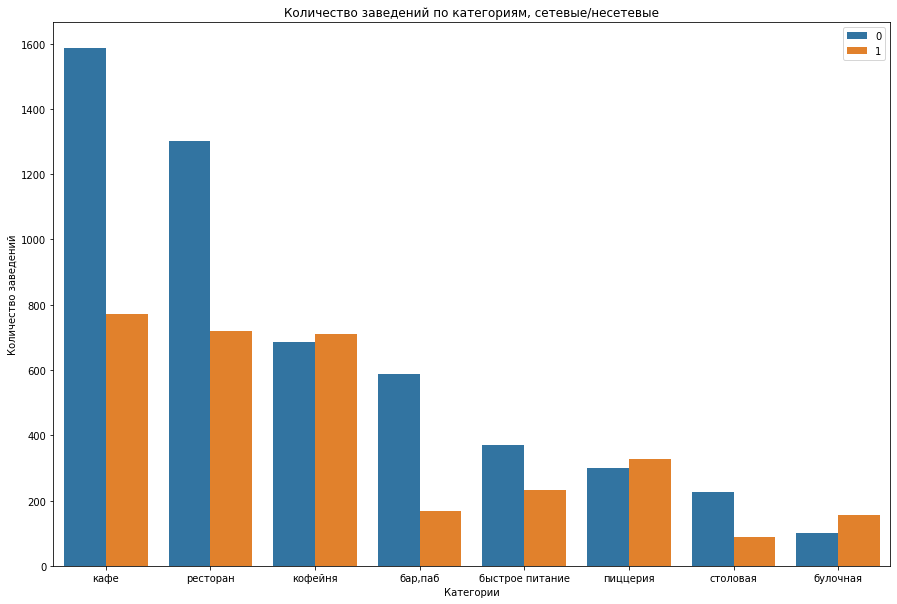

In [39]:
data_categorizes =  data.groupby(['category', 'chain'], as_index=False)['name'].count().sort_values(by='name', ascending=False)
plt.figure(figsize=(15,10))
ax = sns.barplot(data=data_categorizes, x='category', y='name', hue='chain')
ax.set_title('Количество заведений по категориям, сетевые/несетевые')
ax.set_xlabel('Категории')
ax.set_ylabel('Количество заведений')
ax.legend();
plt.show()

</b> У категорий кофейни, пиццерии, булочные преобладают именно сети

#### Топ-15 популярных сетей в Москве<a id="analysis_5"></a>

In [40]:
# сгруппируем по категорям и названию сети по сетевым заведениям
top_popular_chains = (data.query('chain == 1')
                      .groupby(['category', 'name'], as_index=False)['address'].count().sort_values(by='address',\
                                                                                                      ascending=False)
)
top_popular_chains = top_popular_chains.head(15)
top_popular_chains

,category,name,address
762,кофейня,Шоколадница,117
796,пиццерия,Домино'с Пицца,76
795,пиццерия,Додо Пицца,74
664,кофейня,One Price Coffee,70
1100,ресторан,Яндекс Лавка,68
637,кофейня,Cofix,65
884,ресторан,Prime,49
707,кофейня,КОФЕПОРТ,42
430,кафе,Кулинарная лавка братьев Караваевых,38
1057,ресторан,Теремок,36


Построим визуализацию

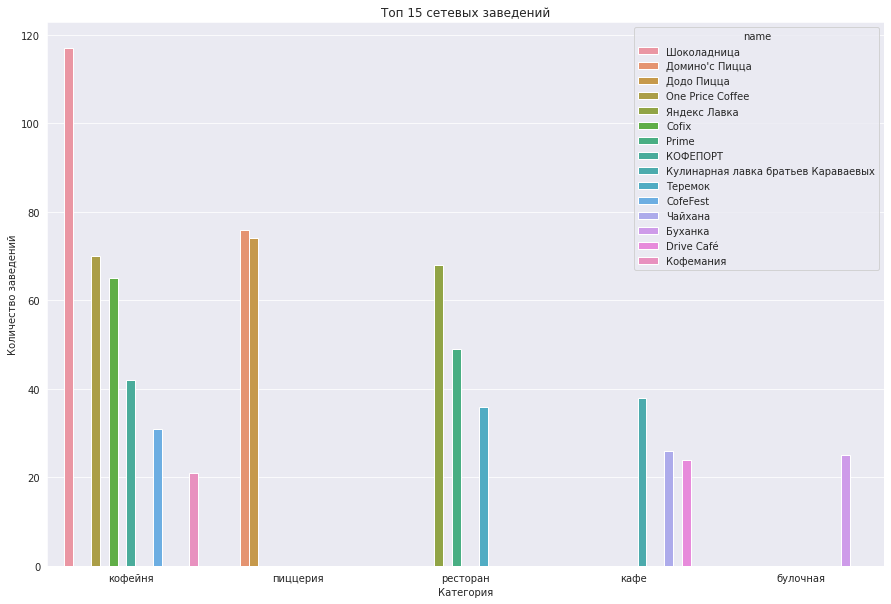

In [41]:
plt.figure(figsize=(15,10))
sns.set_style("darkgrid")
ax = sns.barplot(data=top_popular_chains, x='category', y='address', hue='name')
ax.set_title('Топ 15 сетевых заведений')
ax.set_xlabel('Категория')
ax.set_ylabel('Количество заведений')
plt.show()

Самая популярная сеть заведений - "Шоколадница", 116 точек
<br>Далее, Доминос Пицца и Додо пицца - 76 и 74 заведения соответственно</br>
<br>Замыкает топ 15 кофейня "Кофемания" - 21 точка.

6 из 15 самых популярных сетевых заведений - кофейни. 
<br> 2 пиццерии. По 3 ресторана и кафе, 1 булочная</br>


#### Общее количество заведений и количество заведений каждой категории по районам. <a id="analysis_6"></a>

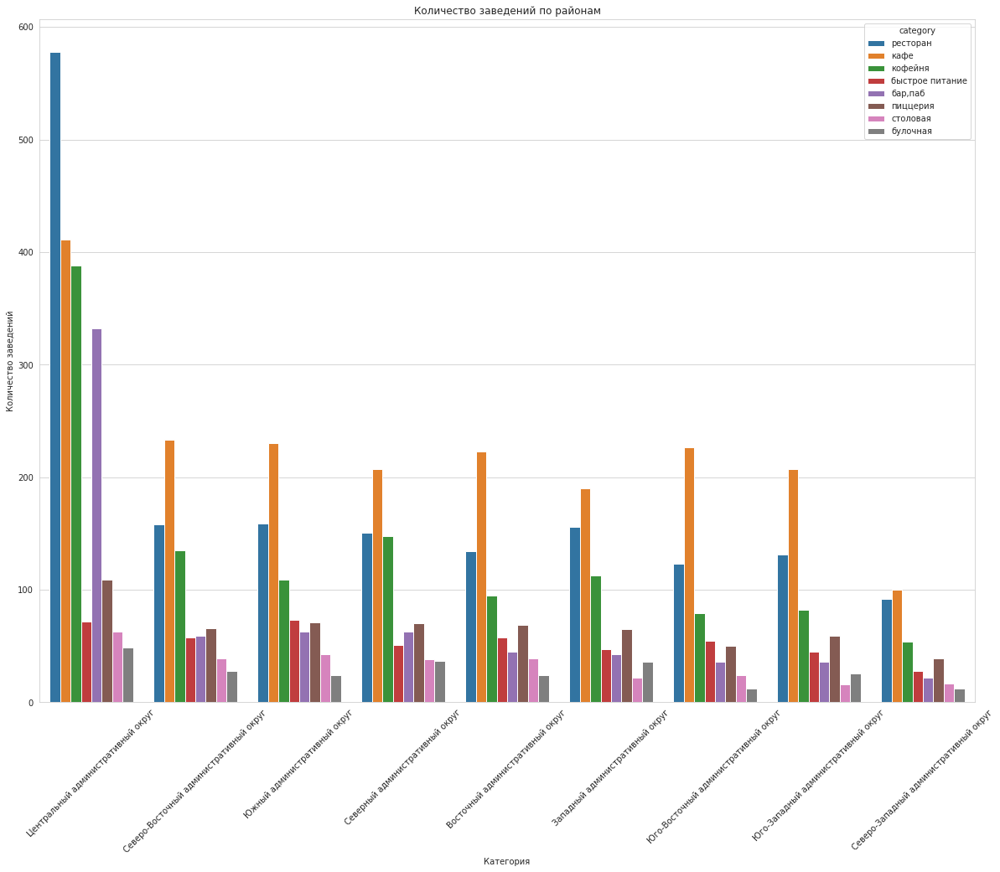

In [63]:
districts_categories =  (
    data.groupby(['category', 'district', 'address'], as_index=False)['address']
    .count().sort_values(by='address', ascending=False, kind='stable')
)
plt.figure(figsize=(20,15))
sns.set_style("whitegrid")
ax = sns.countplot(data=districts_categories, 
                   x='district', 
                   hue='category',
                   order = districts_categories['district'].value_counts().index)
plt.xticks(rotation=45)
ax.set_title('Количество заведений по районам')
ax.set_xlabel('Категория')
ax.set_ylabel('Количество заведений')
plt.show()

В датасете присутствуют 9 АО Москвы. Больше всего заведений в ЦАО. Точнее, наблюдается большое количество ресторанов.
Во всех остальных районах больше кафе, чем ресторанов

#### Распределение средних рейтингов по категориям заведений<a id="analysis_7"></a>

In [64]:
# сгруппируем по категориям и посчитаем средний рейтинг
mean_rating = data.groupby('category', as_index=False)['rating'].mean().sort_values(by='rating')

fig = px.bar(mean_rating, x='rating', y='category', text='rating', color='category')
fig.update_layout(title='Распределение средних рейтингов по категориям заведений',
                   xaxis_title='Рейтинг',
                   yaxis_title='Название категорий')
fig.update_xaxes(range=[3, 4.5])
fig.show()

Видно, что средний рейтинг выше у баров и пабов (4.4)
<br>Пиццерии - 4.3</br>
<br>Далее, рестораны - 4.29</br>
<br>Кофейни - 4.28</br>
<br>В целом, средний рейтинг распредён между категориями приблизительно одинаково, за исключением Быстрого питания и кафе</br>

#### Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района.<a id="analysis_8"></a>

In [65]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Исходя из картограммы, самый высокий медианный рейтинг заведений в Северо-Восточном АО. Самый низкий показатель в Восточном АО.

#### Все заведения датасета на карте<a id="analysis_9"></a>

In [66]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

На карте видно, что больше всего каких-либо заведений в центре Москвы

#### Топ-15 улиц по количеству заведений. График распределения количества заведений и их категорий по этим улицам. <a id="analysis_10"></a>

In [67]:
# сгруппируем по улицам и посчитаем кол-во заведений
street_data = data.groupby(['street'], as_index=False)['address'].count().sort_values(by='address', ascending=False)
street_data = street_data.head(15)
street_data

,street,address
1090,проспект Мира,184
773,Профсоюзная улица,122
525,Ленинский проспект,107
1087,проспект Вернадского,97
373,Дмитровское шоссе,88
298,Варшавское шоссе,76
455,Каширское шоссе,76
523,Ленинградский проспект,72
524,Ленинградское шоссе,70
550,МКАД,65


In [68]:
# сгруппируем по категориям
categories_streets = data.groupby(['street','category'], as_index=False)['address'].count()
categories_streets

,street,category,address
0,1-й Автозаводский проезд,кафе,1
1,1-й Балтийский переулок,ресторан,1
2,1-й Варшавский проезд,кафе,1
3,1-й Вешняковский проезд,кафе,1
4,1-й Волоколамский проезд,кафе,1
...,...,...,...
3813,шоссе Энтузиастов,кафе,10
3814,шоссе Энтузиастов,кофейня,7
3815,шоссе Энтузиастов,пиццерия,2
3816,шоссе Энтузиастов,ресторан,7


In [70]:
# проверим улицы в street_data
top15_categories = (
    categories_streets[categories_streets['street'].isin(street_data['street'])]
    .sort_values(by='address', ascending=False)
)


In [72]:
# построим график
ax = px.bar(top15_categories, x='address', y='street', color='category')
ax.update_layout(title='Топ 15 улиц по количеству заведений',
                 xaxis_title='Количество заведений',
                 yaxis={'categoryorder':'total ascending'})
ax.show() # выводим график

Больше всего заведений на проспекте Мира - 184 заведения. Больше всего Кафе и ресторанов. Также, кофеен.
<br> Далее идёт Профсоюзная улица и Ленинский проспект - 122 и 107 заведения соответственно</br>

#### Улицы, на которых находится только один объект общепита<a id="analysis_11"></a>

In [73]:
street_data_one = data.groupby(['street'], as_index=False)['address'].count().sort_values(by='address', ascending=False)
street_data_one = street_data_one.query('address ==1')
street_data_one

,street,address
1226,улица Капотня,1
1436,улица Шкулёва,1
1249,улица Костякова,1
1439,улица Шухова,1
1421,улица Фотиевой,1
...,...,...
708,Отрадный проезд,1
709,Павелецкая набережная,1
712,Панкратьевский переулок,1
716,Парусный проезд,1


In [74]:
# сгруппируем по категориям
categories_streets_one = data.groupby(['street','category'], as_index=False)['address'].count()
categories_streets_one

,street,category,address
0,1-й Автозаводский проезд,кафе,1
1,1-й Балтийский переулок,ресторан,1
2,1-й Варшавский проезд,кафе,1
3,1-й Вешняковский проезд,кафе,1
4,1-й Волоколамский проезд,кафе,1
...,...,...,...
3813,шоссе Энтузиастов,кафе,10
3814,шоссе Энтузиастов,кофейня,7
3815,шоссе Энтузиастов,пиццерия,2
3816,шоссе Энтузиастов,ресторан,7


In [75]:
# проверим улицы в street_data_one
streets_one = categories_streets_one[categories_streets_one['street'].isin(street_data_one['street'])]
streets_one

,street,category,address
0,1-й Автозаводский проезд,кафе,1
1,1-й Балтийский переулок,ресторан,1
2,1-й Варшавский проезд,кафе,1
3,1-й Вешняковский проезд,кафе,1
7,1-й Голутвинский переулок,"бар,паб",1
...,...,...,...
3786,улица Шкулёва,ресторан,1
3787,улица Шкулёва 4,кофейня,1
3790,улица Шухова,ресторан,1
3800,улица Юннатов,столовая,1


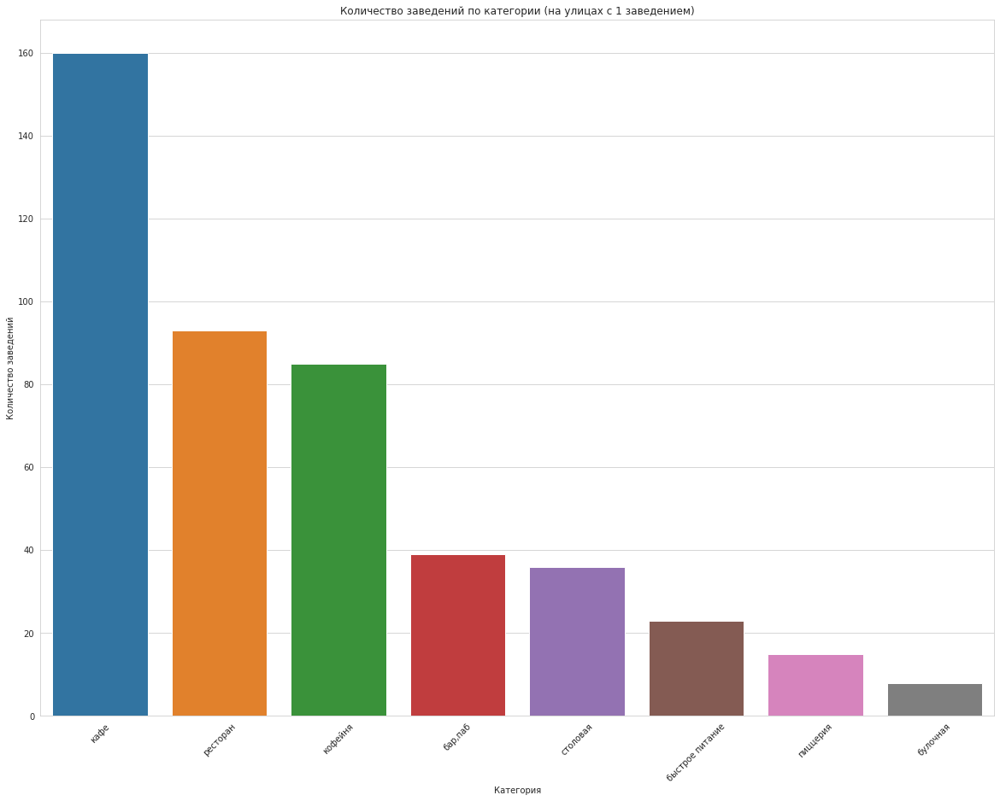

In [76]:
# построим график для определения категорий общепитов на улицах с 1 заведением
plt.figure(figsize=(20,15))
sns.set_style("whitegrid")
ax = sns.countplot(data=streets_one, x='category', order = streets_one['category'].value_counts().index)
plt.xticks(rotation=45)
ax.set_title('Количество заведений по категории (на улицах с 1 заведением)')
ax.set_xlabel('Категория')
ax.set_ylabel('Количество заведений')
plt.show()

Там, где только 1 заведения, обычно, находится либо кафе, либо ресторан, либо кофейня. Наиболее часто встречаются кафе.
<br> Наименее часто встречается булочная</br>
<br>Можно сказать, что, те улицы, на которых находится только 1 заведение, обычно, являются низкотрафиковыми. Соответственно, те заведения, которые напрямую зависят от количества проходящих мимо людей, наименее вероятно будут открываться в таких локациях.


#### Фоновая картограмма (хороплет) со средними чеками для каждого района<a id="analysis_12"></a>

In [77]:
# посчитаем медиану для каждого района
median_avg_bill = data.groupby('district', as_index=False)['middle_avg_bill'].median()
median_avg_bill

,district,middle_avg_bill
0,Восточный административный округ,550.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [78]:
median_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=median_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный средний чек заведений по районам',
).add_to(median_map)

# выводим карту
median_map

Самый высокий медианный средний чек в ЦАО и ЗАО.
<br> В целом, тенденция такова, что, чем дальше от центра города, тем ниже медианный средний чек </br>
<br>Например, в СВАО, ЮАО и ЮВАО медианный средний чек ниже чем в ЦАО почти в 2 раза</br>

#### Средние чеки в заведениях с плохим рейтингом<a id="analysis_13"></a>

Определим, какой рейтинг является "плохим"

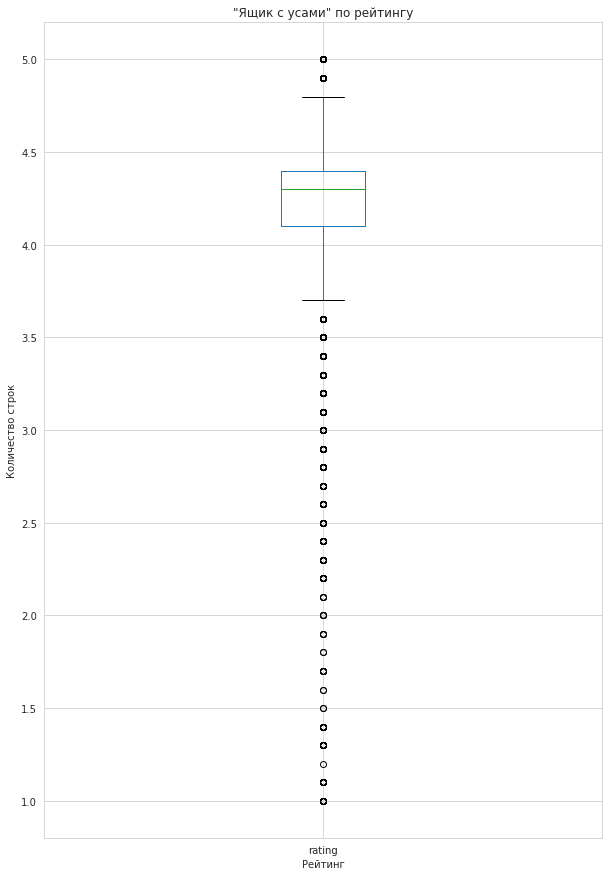

In [79]:
data.boxplot(column='rating', figsize=(10,15))
plt.title('"Ящик с усами" по рейтингу')
plt.xlabel('Рейтинг')
plt.ylabel('Количество строк')
plt.show()

Исходя из графика, можно определить, что рейтинг ниже 4 можно считать плохим

In [80]:
# создадим датасет с заведениями с плохим рейтингом
bad_rating = data.query('rating < 4')
bad_rating.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
28,Mafe,кафе,"Москва, МКАД, 78-й километр, 14к1",Северный административный округ,"ежедневно, 10:00–19:00",55.893061,37.501319,3.8,средние,Средний счёт:400–600 ₽,500.0,NaN,0,NaN,МКАД,False
36,Пекарня № 1 Грузинская кухня,кафе,"Москва, Коровинское шоссе, 33А",Северный административный округ,"ежедневно, 10:00–22:00",55.882222,37.518057,3.9,NaN,NaN,NaN,NaN,0,21.0,Коровинское шоссе,False
37,Халяль закусочная,кафе,"Москва, Коровинское шоссе, 46, стр. 5",Северный административный округ,"ежедневно, 08:00–23:00",55.888023,37.515443,3.9,NaN,NaN,NaN,NaN,0,NaN,Коровинское шоссе,False
40,Кафе,кафе,"Москва, Ижорская улица, 18, стр. 1",Северный административный округ,NaN,55.895115,37.524902,3.7,NaN,NaN,NaN,NaN,0,NaN,Ижорская улица,False
42,Варня кафе,быстрое питание,"Москва, Коровинское шоссе, 29, корп. 1",Северный административный округ,"ежедневно, 09:00–23:00",55.880010,37.520204,3.8,NaN,NaN,NaN,NaN,0,46.0,Коровинское шоссе,False


In [81]:
# сгруппируем по категориям и посчитаем средний чек
bad_rating_mean = bad_rating.groupby('category', as_index=False)['middle_avg_bill'].median().sort_values(by='middle_avg_bill')

ax = px.bar(bad_rating_mean, x='middle_avg_bill', y='category', text='middle_avg_bill', color='category')
ax.update_layout(title='Распределение средних чеков по категориям заведений с плохими отзывами',
                   xaxis_title='Средний чек',
                   yaxis_title='Название категорий')
ax.show()

У баров и пабов самый высокий медианный средний чек среди заведений с низким рейтингом - 582.5 руб.
<br> Далее, идут ресторан и пиццерия - 500 руб</br>
<br> Самый низкий средний чек в столовой - 275 руб</br>

#### Категории заведений с низким рейтингом<a id="analysis_14"></a>

In [82]:
# сгруппируем по категориям и посчитаем количество
category_rating = bad_rating.groupby('category', as_index=False)['address'].count().sort_values(by='address')

ax = px.bar(category_rating, x='address', y='category', text='address', color='category')
ax.update_layout(title='Количество заведений по категориям',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название категорий')
ax.show()

Больше всего категории "Кафе" среди заведений с низкими оценками. Притом, с большим отрывом от ресторанов.
Меньше всего заведений: булочных, пиццерий и баров

#### Вывод:<a id="analysis_15"></a>

Таким образом, можно сделать вывод, что в регионе больше всего кафе и ресторанов - 2356(28% от общего числа заведений) и 2021(24%) точек соответственно.
<br>Меньше всего Булочных - 255 (3%)</br>
<br>В среднем, посадочных мест в ресторанах и барах/пабах - 85 и 80 мест соответственно. Меньше всего в пиццериях и булочных - 52 и 50 мест соответственно.</br>
<br>Определено, что несетевых заведений больше чем сетевых - 5157(61.92%) против 3171(38.08%) соответственно.</br>
<br>Сетевыми чаще являются кафе, кофейни и рестораны. Столовые реже всего являются сетевыми</br>
<br>Самая популярная сеть заведений - кофейня "Шоколадница", 116 точек.</br>
<br>6 из 15 самых популярных сетевых заведений - кофейни. Можно сделать вывод, что кофейни пользуются большим спросом.</br>
<br>Исходя из картограммы, больше всего заведений в ЦАО. Что логично, т.к. наибольший трафик, обычно, в центре города</br>
<br>Средний рейтинг выше у баров и пабов. (4.4) У пиццерий - 4.3, Далее, рестораны - 4.29, Кофейни - 4.28</br>

<br>Исходя из картограммы, самый высокий медианный рейтинг заведений в Северо-Восточном АО. Самый низкий показатель в Восточном АО.</br>
<br>Наибольшее число заведений находятся на проспекте Мира - 184 заведения. Больше всего Кафе и ресторанов, а, также, кофеен.
Далее идёт Профсоюзная улица и Ленинский проспект - 122 и 107 заведения соответственно.</br>
<br>На тех улицах, где только 1 заведение, обычно, находится либо кафе, либо ресторан, либо кофейня. Наиболее часто встречаются кафе. Наименее часто встречается булочная.</br>Те улицы, на которых находится только 1 заведение, обычно, являются низкотрафиковыми. Соответственно, те заведения, которые напрямую зависят от количества проходящих мимо людей, наименее вероятно будут открываться в подобных локациях.</br>
<br>Самый высокий медианный средний чек в ЦАО и ЗАО.</br>Чем дальше от центра города, тем ниже медианный средний чек</br>

<br>У баров и пабов самый высокий медианный средний чек среди заведений с низким рейтингом - 582.5 руб.</br>
<br>Далее, идут ресторан и пиццерия - 500 руб</br>
<br>Самый низкий средний чек в столовой - 275 руб</br>
<br>Больше всего категории "Кафе" среди заведений с низкими оценками.</br>

### Детализация исследования: открытие кофейни<a id="detail"></a>

#### Кофейни в датасете. Их расположения и особенности<a id="detail_1"></a>

In [83]:
# посчитаем количество кофеен в датасете
coffee_data = data.query('category == "кофейня"')
coffee_data['address'].count()

1398

Всего в датасете 1398 кофеен. Построим картограмму

In [84]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
coffee_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(coffee_map)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_data.apply(create_clusters, axis=1)

# выводим карту
coffee_map

Кофеен больше всего в ЦАО (как и в целом всех заведений). 
<br> Где выше трафик и средний чек - там больше всего кофеен.

Посчитаем круглосуточные кофейни

In [85]:
count = 0 
for row in coffee_data.index:
    if coffee_data['hours'][row]=='ежедневно, круглосуточно':
        count+=1
print('Всего круглосуточных кофеен:', count)

Всего круглосуточных кофеен: 59


Отобразим количество кофеен по районам

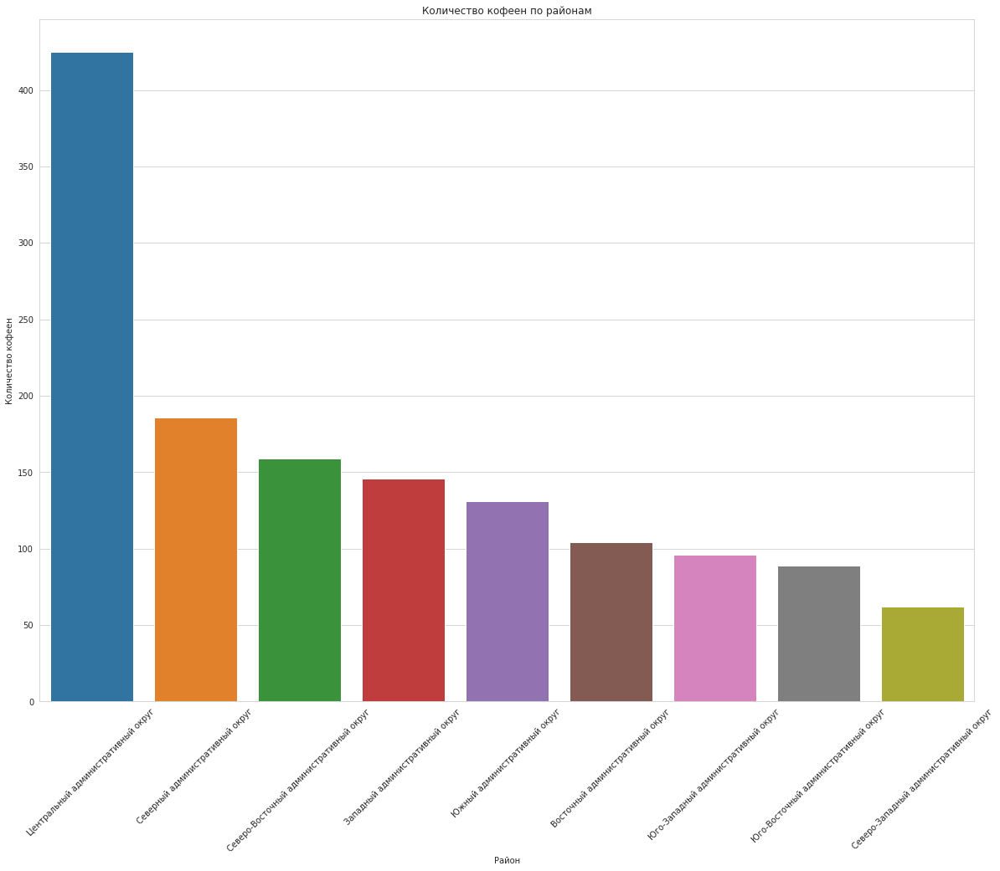

In [95]:
plt.figure(figsize=(20,15))
sns.set_style("whitegrid")
ax = sns.countplot(data=coffee_data, 
                   x='district', 
                   order = coffee_data['district'].value_counts().index)
plt.xticks(rotation=45)
ax.set_title('Количество кофеен по районам')
ax.set_xlabel('Район')
ax.set_ylabel('Количество кофеен')
plt.show()

Больше всего кофеен в ЦАО, САО и СВАО. Меньше всего в СЗАО

#### Рейтинги кофеен<a id="detail_2"></a>

In [96]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
coffee_rating = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг кофеен по районам',
).add_to(coffee_rating)

# выводим карту
coffee_rating

Получили достаточно интересное распределение рейтингов по районам:
<br>Самые высокие медианные рейтинги в СВАО И ВАО. Самые низкие в ЗАО и ЮАО.</br>
<br>Учитывая, что медианный рейтинг в ВАО по всем заведениям низок, то, можно предположить, что в данном районе именно кофейни пользуются большим спросом</br>

#### Определение стоимости кашки капучино<a id="detail_3"></a>

Определим медианную стоимость чашки капучино по районам

In [97]:
# посчитаем медиану для каждого района
median_coffee_cup = coffee_data.groupby('district', as_index=False)['middle_coffee_cup'].median()
median_coffee_cup

,district,middle_coffee_cup
0,Восточный административный округ,135.0
1,Западный административный округ,187.0
2,Северный административный округ,159.0
3,Северо-Восточный административный округ,162.5
4,Северо-Западный административный округ,165.0
5,Центральный административный округ,190.0
6,Юго-Восточный административный округ,147.5
7,Юго-Западный административный округ,198.0
8,Южный административный округ,150.0


In [98]:
median_coffee = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=median_coffee_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный средняя стоимость чашки капучино по районам',
).add_to(median_coffee)

# выводим карту
median_coffee

Самая высокая медианная стоимость чашки капучино в ЦАО и ЮЗАО в районе 190-200 рублей за чашку. Если планировать открытие кофейни в данных районах, для начала стоит предусмотреть стоимость чашки немного меньше медианной - в районе 170-180 рублей.
<br> Далее, идёт ЗАО - в районе 180-189 рублей за чашку.</br>В данном районе можно ориентироваться на стоимость 160-170 рублей за чашку капучино</br>
<br>В ВАО самый низкий медианный чек за чашку капучино - 130-140 рублей. В данном районе можно ориентироваться на 110-120 рублей</br>
<br> В остальных районах стоимость чашки приблизительно одинакова - 150-160 рублей. В этих районах, на начальном этапе стоит ориентироваться на 130-140 рублей за чашку.</br>

#### Рекомендация по открытию кофейни<a id="detail_4"></a>

Исходя из вышесказанного, предлагаю рассмотреть район СВАО для открытия кофейни:
<br> - в данном районе высокая лояльность клиентов к кофейням;</br> 
<br>- относительно небольшое количество точек(всего 102); </br>
<br>- средняя по городу стоимость чашки капучино.</br>
<br> В качестве локации предлагаю рассмотреть  проспект Мира недалеко от станций метро ВДНХ и Алексеевская. Т.к. на данной улице, судя по количеству заведений, высокий трафик. Именно трафик очень сильно влияет на успешность кофейни. </br>
<br> Цену предлагаю установить на уровне 140 рублей за чашку.</br>
<br> С интересной идеей, как у основателей фонда, наиболее вероятен успех заведения, на фоне других конкурентов, находящихся в данной локации

### Вывод:<a id="total"></a>

Было проведено исследование рынка Москвы. Удалось найти интересные особенности для заказчиков - инвесторов из фонда «Shut Up and Take My Money», желающим открыть заведение общественного питания в Москве (ресторан, кафе, кофейню и т.п.)
<br>Была проведена предобработка предоставленных данных.
<br>Было решено не заполнять пропуски медианами или средними значениями , т.к. чеки в сетевых заведениях от района к району могут сильно разниться, не говоря уже о несетевых заведениях. Для более объективной картины оставили пропуски как есть
Из датасета удалены аномалии с большим количеством посадочных мест. Оставлены только те строки, где посадочных мест менее 500 (удалено менее 1%).</br>
<br>Добавлены столбец с названиями улиц, столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)</br>
<br></br>
<br>В процессе анализа, установлено, что в регионе больше всего кафе и ресторанов - 2356(28% от общего числа заведений) и 2021(24%) точек соответственно.</br>
<br>В среднем, посадочных мест в ресторанах и барах/пабах - 85 и 80 мест соответственно.</br>
<br>Определено, что несетевых заведений больше чем сетевых - 5157(61.92%) против 3171(38.08%) соответственно.</br>
<br>Сетевыми чаще являются кафе, кофейни и рестораны. Столовые реже всего являются сетевыми</br>
<br>Самая популярная сеть заведений - кофейня "Шоколадница", 116 точек.</br>
<br>6 из 15 самых популярных сетевых заведений - кофейни. Можно сделать вывод, что кофейни пользуются большим спросом.</br>
<br>Больше всего заведений в ЦАО.</br>
<br>Средний рейтинг выше у баров и пабов- 4.4. У пиццерий - 4.3. Далее, рестораны - 4.29. Кофейни - 4.28</br>
<br>Самый высокий медианный рейтинг заведений в Северо-Восточном АО. Самый низкий показатель в Восточном АО.</br>
<br>Наибольшее число заведений находятся на проспекте Мира - 184 заведения. Больше всего кафе и ресторанов, кофеен.
<br>На тех улицах, где только 1 заведение, обычно, находится либо кафе, либо ресторан, либо кофейня. Наиболее часто встречаются кафе.</br>
<br>Самый высокий медианный средний чек в ЦАО и ЗАО.</br>Чем дальше от центра города, тем ниже медианный средний чек</br>
<br>У баров и пабов самый высокий медианный средний чек среди заведений с низким рейтингом - 582.5 руб.</br>
<br>Больше всего категории "Кафе" среди заведений с низкими оценками.</br>
<br></br>
<br>Рекомендации:</br>
<br>В качестве локации предлагаю рассмотреть  проспект Мира недалеко от станций метро ВДНХ и Алексеевская. Т.к. на данной улице, судя по количеству заведений, высокий трафик. Именно трафик очень сильно влияет на успешность кофейни.</br>
<br>Предлагаю выбрать район СВАО.</br>Плюсы:
<br> - в данном районе высокая лояльность клиентов к кофейням;</br> 
<br>- относительно небольшое количество точек(всего 102); </br>
<br>- средняя по городу стоимость чашки капучино.</br>
<br> Цену предлагаю установить на уровне 140 рублей за чашку.</br>
<br> С интересной идеей, как у основателей фонда, наиболее вероятен успех заведения, на фоне других конкурентов, находящихся в данной локации

Презентация: https://disk.yandex.ru/i/lUHmTxyIojsIRw